\title{}
\author{}
\date{}
\maketitle

\thispagestyle{empty}
\vspace*{3cm}

\begin{center}
{\LARGE \textbf{Trabajo Individual}\par}
\vspace{0.3cm}
{\LARGE \textbf{Métodos Estadísticos en Minería de Datos}\par}

\vspace{0.8cm}
\rule{0.8\textwidth}{0.4pt}

\vspace{0.8cm}
{\large \textbf{Universidad Carlos III de Madrid}\par}
{\large \textbf{Grado en Estadística y Empresa}\par}

\vspace{1.2cm}
{\Large \textbf{Parte 2 – Problema de Clasificación}\par}

\vspace{2cm}
{\Large \textbf{Alonso Velázquez Torres}\par}
\end{center}

\newpage

# Introducción al problema y conjunto de datos
En esta segunda parte del trabajo, debemos resolver un problema de manera similar a la primera parte, pero utilizando un dataset donde la variable respuesta es de tipo categórico. Hemos elegido el conjunto de datos de `Wine quality red`, bastante conocido dentro de la comunidad de análisis de datos, a menudo utilizado junto con su contraparte `Wine quality white`, sin embargo para los propósitos de este trabajo nos limitaremos al primero. Presenta las siguientes variables:

- *fixed acidity*: Cantidad de varios ácidos no volátiles en g/dm3 (numérica).
- *volatile acidity*: Cantidad de ácido acético en g/dm3, niveles elevados le dan un sabor avinagrado al vino (numérica).
- *citric acid*: Cantidad de ácido cítrico en g/dm3, niveles elevados le dan frescura y aroma al vino (numérica).
- *residual sugar*: Cantidad de azúcar tras la fermentación en g/dm3, afecta a la dulzura del vino (numérica).
- *chlorides*: Cantidad de cloruros (sales) en g/dm3, niveles elevados pueden afectar negativamente al sabor (numérica).
- *free sulfur dioxide*: Cantidad de dióxido de azufre libre en el vino en g/dm3, actúa como antioxidante, preservando la frescura del vino (numérica).
- *total sulfur dioxide*: Cantidad de dióxido de azufre libre en el vino sumado al dióxido de azufre atado a moléculas en g/dm3 (numérica).
- *density*: Densidad del vino en g/cm3 (numérica).
- *pH*: Nivel de pH del vino en escala pH, describe la acided (o alcalinidad) del vino (numérica).
- *sulphates*: Cantidad de sulfatos, fundamentalmente sulfato de potasio, en g/dm3, actúan como conservantes (numérica).
- *alcohol*: Porcentaje de alcohol en el vino (numérica).
- *quality*: Calidad del vino, según enólogos expertos (categórica del 0 al 10).

Este conjunto me llamó la atención debido a que es moderadamente conocido y por tanto existe gran cantidad de información a cerca de las variables que recoge y cómo afectan al vino, además de que es de los pocos que he encontrado que poseen exclusivamente variables numéricas (a excepción de la variable respuesta), lo que permite poder aplicarle todas las técnicas vistas en clase y con mayor facilidad, sacándole más partido al dataset. A todo esto se le suma el hecho de que construir modelos de predicción para la calidad del vino posee una finalidad práctica de evidente utilidad.

Las hipótesis iniciales sobre los resultados que el estudio de este conjunto de datos pueda mostrar se relacionan con comprobar si las cualidades que se le atribuyen a cada componente del vino expresado por cada variable (ácido acético, cítrico, azúcares, cloruro de sodio, sulfatos, ...) realmente impactan en la evaluación de cada vino tal y como se teoriza en la bibliografía (resumida en la explicación de cada variable). Y cuál o cuáles son los componentes de mayor importancia a la hora de determinar la calidad del vino.

# Exploración del conjunto de datos
Seguiremos el mismo procedimiento realizado en la primera parte de este proyecto para el análisis exploratorio de los datos, adaptándonos a la diferente naturaleza de este conjunto de datos, y alterándolo según sus necesidades específicas.

In [30]:
# librerías
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
import plotly.express as px
import numpy as np
from sklearn.metrics import silhouette_score, accuracy_score, balanced_accuracy_score, classification_report, f1_score, confusion_matrix
from sklearn.model_selection import train_test_split, GridSearchCV, StratifiedKFold
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier, plot_tree
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder, OneHotEncoder, LabelEncoder
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score, root_mean_squared_error
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, regularizers
from sklearn.manifold import MDS
from sklearn.metrics import pairwise_distances
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import DBSCAN
from sklearn.ensemble import RandomForestClassifier
import shap

# semillas
np.random.seed(42)
tf.random.set_seed(42)

In [2]:
# datos brutos
wines = pd.read_csv('winequality-red_classification.csv')

In [3]:
# exploración inicial
print(wines.shape,'\n')
print(wines.dtypes,'\n')
wines.head()

(1599, 12) 

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
dtype: object 



,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


Nuestro conjunto de datos posee 1600 entradas, con todas sus variables siendo de tipo numérico. Revisando la bibliografía nos damos cuenta de que el tipo asignado a quality es incorrecto, debemos cambiarlo de int64 a object.

In [4]:
wines['quality'] = wines['quality'].astype('object')
wines.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                  object
dtype: object

In [5]:
# verificamos nulos y duplicados
print(wines.isnull().sum(),'\n')
print(wines.duplicated().sum())

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
dtype: int64 

240


Encontramos que nuestro conjunto de datos no posee valores nulos, pero sí 240 vinos con los mismos valores en todas las variables que al menos algún otro vino del dataset. Atendiendo a la naturaleza de los datos (11 variables numéricas continuas distintas y con precisión de medición considerablemente elevada en algunos casos), tenemos motivos suficientes para considerarlos valores duplicados y no un vino que ha resultado tener las mismas características que otro, por tanto lo descartamos.

In [6]:
wines = wines[~wines.duplicated()]
wines.shape

(1359, 12)

In [7]:
# obtenemos métricas descriptivas para las variables
num = wines.select_dtypes('number')
cat = wines['quality']
print(num.describe().T,'\n')
print(cat.describe().T)

                       count       mean        std      min      25%      50%  \
fixed acidity         1359.0   8.310596   1.736990  4.60000   7.1000   7.9000   
volatile acidity      1359.0   0.529478   0.183031  0.12000   0.3900   0.5200   
citric acid           1359.0   0.272333   0.195537  0.00000   0.0900   0.2600   
residual sugar        1359.0   2.523400   1.352314  0.90000   1.9000   2.2000   
chlorides             1359.0   0.088124   0.049377  0.01200   0.0700   0.0790   
free sulfur dioxide   1359.0  15.893304  10.447270  1.00000   7.0000  14.0000   
total sulfur dioxide  1359.0  46.825975  33.408946  6.00000  22.0000  38.0000   
density               1359.0   0.996709   0.001869  0.99007   0.9956   0.9967   
pH                    1359.0   3.309787   0.155036  2.74000   3.2100   3.3100   
sulphates             1359.0   0.658705   0.170667  0.33000   0.5500   0.6200   
alcohol               1359.0  10.432315   1.082065  8.40000   9.5000  10.2000   

                           

Procedemos a generar visualizaciones del dataset para comprender mejor su naturaleza. Notaremos que a pesar de que la variable quality es categórica, dada su codificación numérica y sentido de escala, se puede manipular y visualizar como una variable pseudo-numérica no continua.

En este primer gráfico podemos apreciar algunas correlaciones aunque débiles, pero en general no parece que las variables de este conjunto de datos estén muy correladas entre sí, esto nos hace pensar que técnicas de reducción de la dimensión no serán muy eficaces. Podemos ver además que aunque el rango teórico de quality es de 0 a 10, sólo encontramos vinos calificados entre 3 y 8, junto con el hecho de que presenta clases desbalanceadas, dado que 5 y 6 son clases mucho más frecuentes de 4 y 7, por ejemplo.

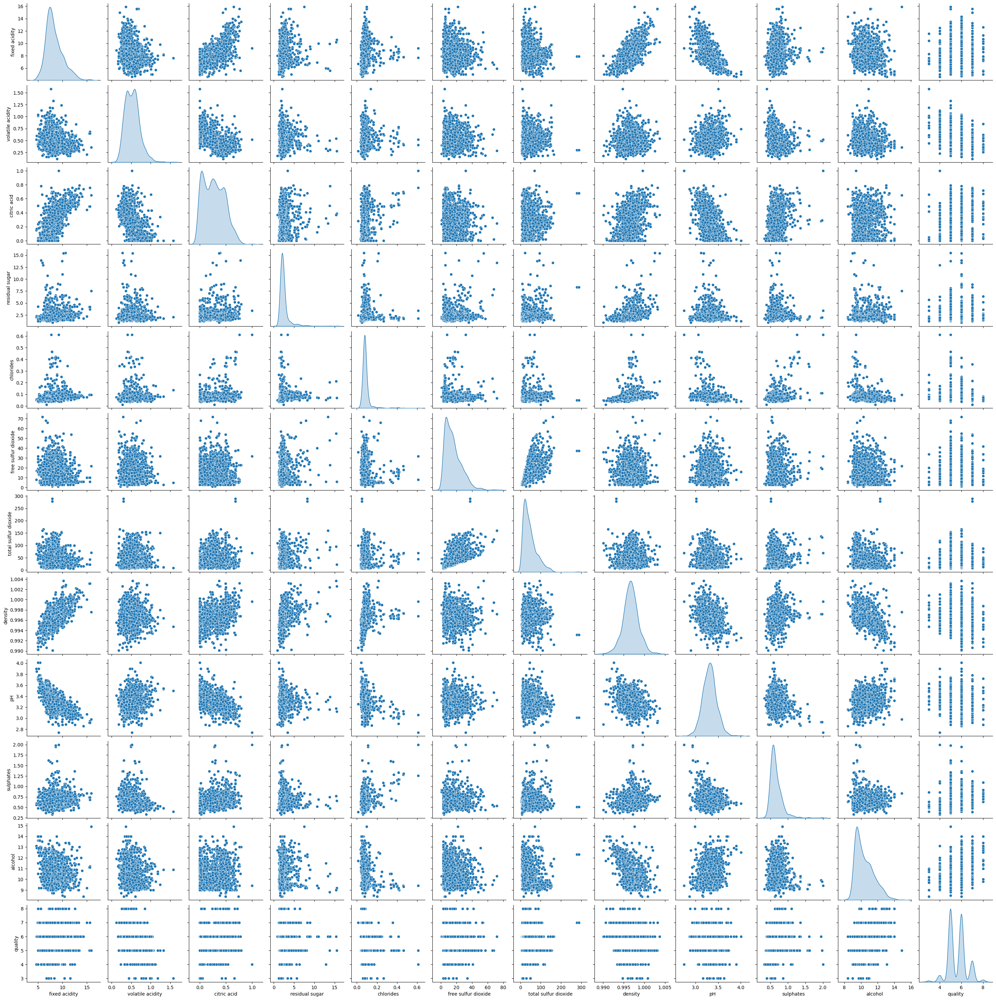

In [8]:
sns.pairplot(
    wines,
    diag_kind="kde"
)
plt.show()

Investigamos más en profundidad las correlaciones con una matriz de correlaciones similar a la de la primera parte, vemos que sí existen pares de variables correladas sin embargo ninguna correlación es fuerte (>|0.7|), la correlación más potente existe entre fixed acidity y pH, con -0.69, lo cual tiene sentido dado que a mayor pH más alcalino será el vino.

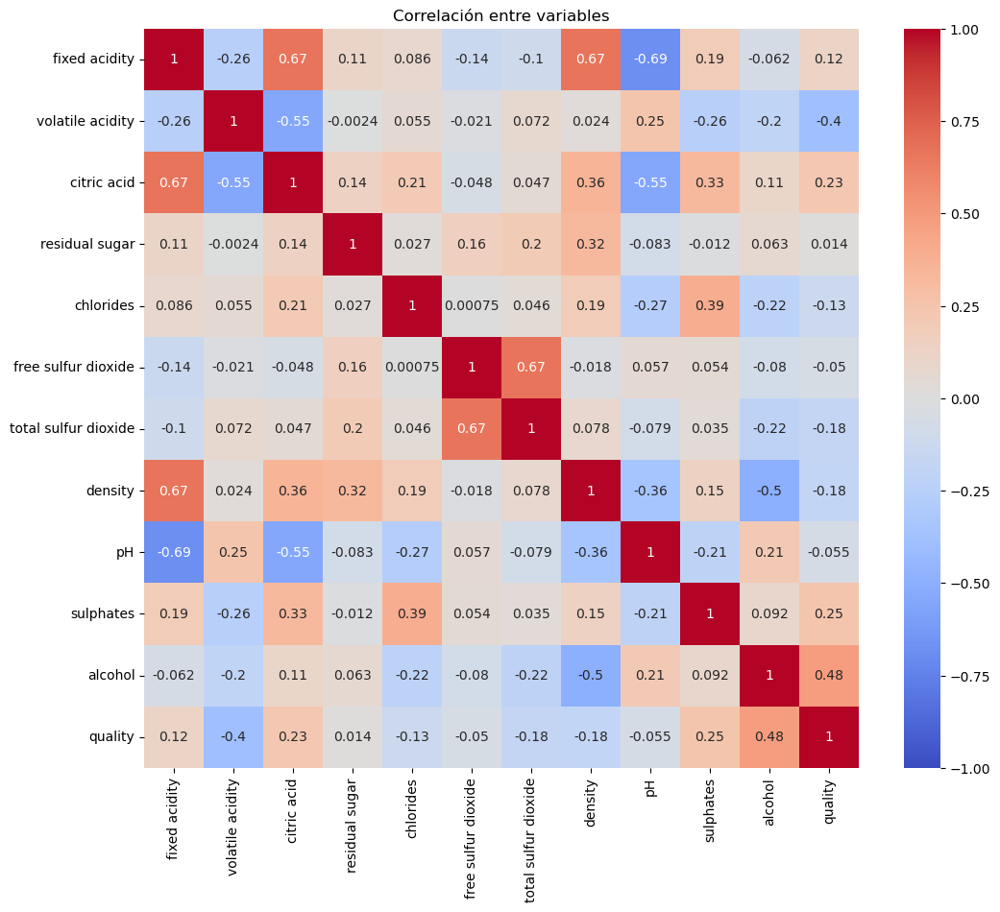

In [9]:
plt.figure(figsize=(12, 10))
sns.heatmap(wines.corr(), cmap="coolwarm", annot=True, vmin=-1, vmax=1)
plt.title("Correlación entre variables")
plt.show()

Seguidamente obtenemos los boxplots, como en la primera parte encontramos que algunas variables dominan la varianza y por tanto deberemos estandarizar.

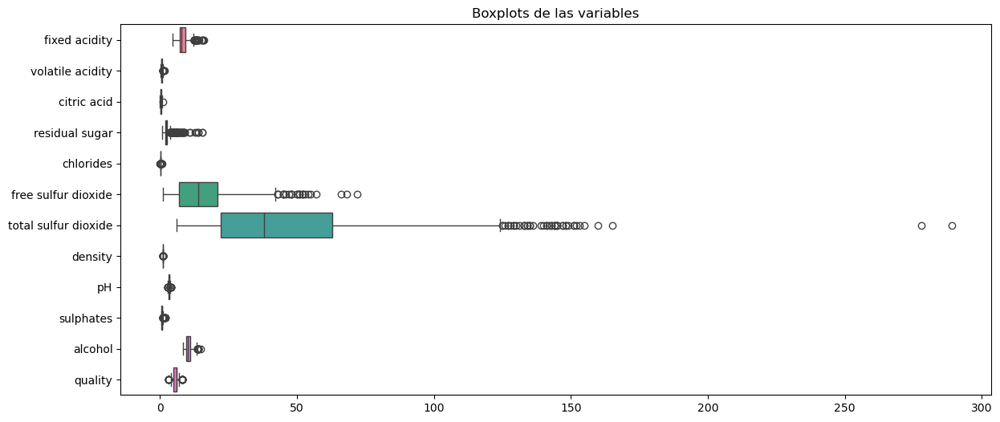

In [10]:
plt.figure(figsize=(14, 6))
sns.boxplot(data=wines, orient="h")
plt.title("Boxplots de las variables")
plt.show()

Ahora que podemos ver mejor la distribución de cada variable, detectamos la gran cantidad de atípicos que hay, sin embargo dada la naturaleza de las variables son valores que tienen sentido teórico y por tanto no podemos concluir que sean errores de imputación o datos falsos, mantendremos sus valores en el dataset para evitar pérdida de información genuina.

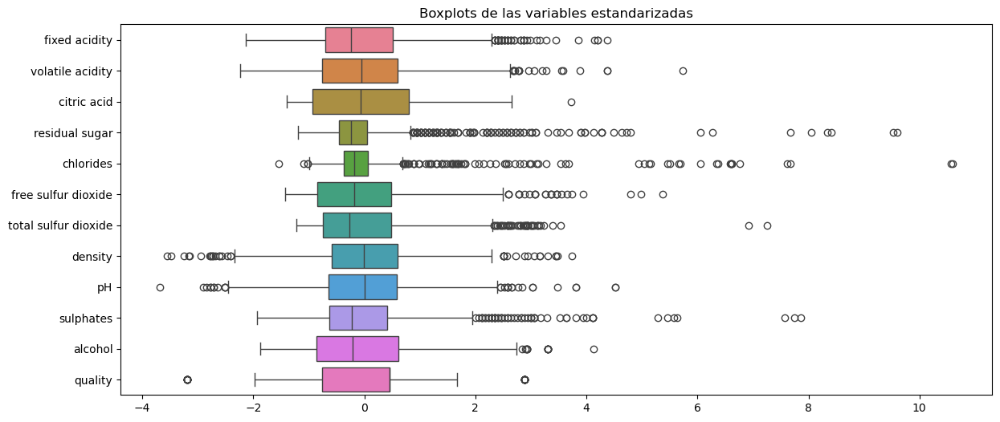

In [11]:
scaler = StandardScaler()

wines_scaled = pd.DataFrame(
    scaler.fit_transform(wines),
    columns = wines.columns,
    index = wines.index
)

plt.figure(figsize=(14, 6))
sns.boxplot(data=wines_scaled, orient="h")
plt.title("Boxplots de las variables estandarizadas")
plt.show()

Realizamos ahora algunas visualizaciones extra.

A continuación tenemos otro gráfico en 3D manipulable donde se grafican los vinos en un espacio conformado por 3 variables que actúan como marcadores de la acided del vino. Se puede observar que se valora un mayor contenido de ácido cítrico, junto con un menor contenido de ácido acético y un valor de entre 2.8 y 3.4 de pH. Esto coincide en gran medida con la teoría de la bibliografía sobre las variables.

In [12]:
# notamos que para graficar en función de quality, debemos reconvertirla en numérica, 
# esto no altera el sentido de la variable como hemos mencionado anteriormente
wines['quality'] = wines['quality'].astype('int64')

fig = px.scatter_3d(
    wines,
    x="citric acid", y="volatile acidity", z="pH",
    color="quality",
    size="quality",
    size_max=20,  # tamaño máximo de los marcadores
    color_continuous_scale="Viridis",
    opacity=1
)

fig.update_layout(
    title="Gráfico 3D interactivo - Acided general del vino<br><sup>Color y tamaño según calidad</sup>",
    scene=dict(
        xaxis_title="ácido cítrico",
        yaxis_title="ácido acético",
        zaxis_title="pH"
    )
)

fig.show()

Para este último gráfico debemos de nuevo utilizar variables estandarizas para que no dominen unas sobre otras en la escala del radar, ya que no nos interesan valores absolutos de dichas variables sino si la calidad aumenta con su valor o no. Podemos observar que sistemáticamente a medida que se recogen mayores valores de alcohol, la calidad es mayor, lo mismo sucede en menor medida con sulphates. De manera contraria, vemos que las calidades más bajas son las que incluyen valores elevados de variables como volatile acidity o chlorides. Todas estas conclusiones coinciden, de nuevo, con lo propuesto por la bibliografía.

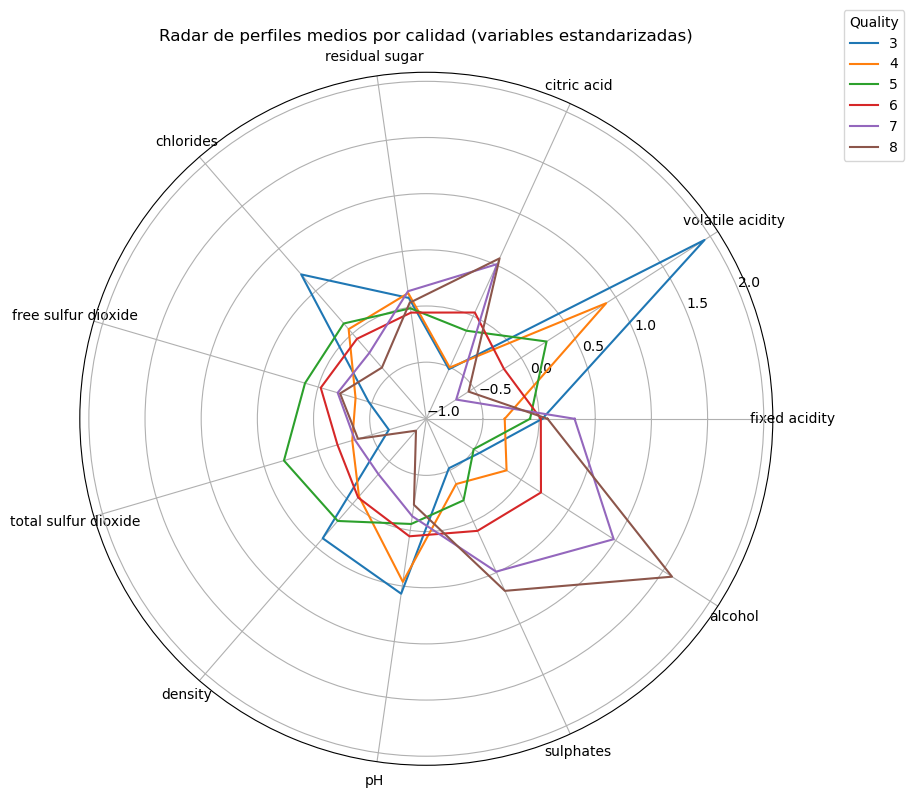

In [13]:
df_scaled = wines_scaled.copy()

variables = df_scaled.columns.drop("quality")
qualities = sorted(df_scaled["quality"].unique())

angles = np.linspace(0, 2*np.pi, len(variables), endpoint=False)

plt.figure(figsize=(9,9))

for q in qualities:
    # medias de las variables estandarizadas
    mean_vals = df_scaled[df_scaled["quality"] == q][variables].mean().values
    
    # cerrar el círculo del radar
    mean_vals = np.concatenate((mean_vals, [mean_vals[0]]))
    ang = np.concatenate((angles, [angles[0]]))

    plt.polar(ang, mean_vals, label=f"Quality {q}")

plt.xticks(angles, variables)
plt.title("Radar de perfiles medios por calidad (variables estandarizadas)")
plt.legend(loc="upper right", bbox_to_anchor=(1.2, 1.1), labels=['3', '4', '5', '6', '7', '8'], title="Quality")
plt.show()

# Resolución del problema de clasificación
De nuevo, antes de aplicar cualquier técnica o modelo, debemos separar la variable respuesta del dataset para evitar fuga de información.

Los pasos que seguiremos para la resolución de este problema serán los siguientes: Primero, aplicaremos MDS para reducir la dimensión de nuestro dataset, tras esto aplicaremos DBSCAN para hacer clustering sobre el dataset original y el dataset de dimensión reducida. Finalmente, para el dataset que tenga una estructura de clusters más clara, modelaremos un árbol de regresión y una red neuronal, comparando sus rendimientos.

Comenzaremos con la reducción de dimensiones mediante MDS, dado que todas nuestras variables son numéricas y las hemos estandarizado, utilizaremos las distancias euclídeas. Debemos aplicar la técnica del codo a los resultados de stress-1 (stress de Kruskal) para cada valor de k dimensiones y así encontrar su mejor valor.

Cabe mencionar que MDS no es la mejor técnica de reducción de dimensiones, dado que su uso principales es para visualizar en un plano de menor dimensión individuos y sus distancias entre sí. Para nuestro propósito convendría más utilizar PCA como hicimos en la primera parte de este trabajo. A pesar de esto, se ha decidio trabajar con MDS para explorar nuevas técnicas y que el trabajo en su conjunto abarque una mayor variedad de técnicas vistas a lo largo de esta asignatura. Como contraparte, las dimensiones que construyamos no serán interpretables como lo eran los componentes principales del PCA.

    k  Stress-1
0   1    0.5376
1   2    0.2803
2   3    0.1662
3   4    0.1265
4   5    0.1028
5   6    0.0832
6   7    0.0810
7   8    0.0729
8   9    0.0651
9  10    0.0636


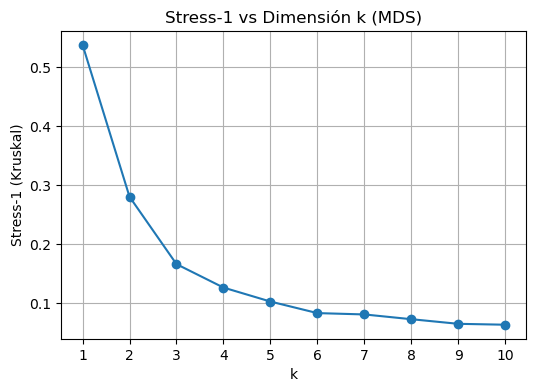

In [14]:
MDSdata = wines_scaled.drop(columns='quality')

dist_matrix = pairwise_distances(MDSdata, metric="euclidean")

# función dada en los materiales de la asignatura
def stress1_from_embedding(D_orig, X_emb):
    diff = X_emb[:, None, :] - X_emb[None, :, :]
    d_emb = np.sqrt((diff ** 2).sum(axis=2))
    
    mask = np.triu(np.ones_like(D_orig, dtype=bool), k=1)
    num = ((d_emb - D_orig)[mask] ** 2).sum()
    den = (d_emb[mask] ** 2).sum()
    return np.sqrt(num / den)

results = {}
stress_curve = []

# calculamos un MDS para cada k de entre 1 y 10 (m-1)
for k in range(1, 11):
    mds = MDS(
        n_components=k,
        dissimilarity="precomputed",
        metric=True,
        n_init=1,
        max_iter=100,
        random_state=42
    )
    Xk = mds.fit_transform(dist_matrix)
    s1 = stress1_from_embedding(dist_matrix, Xk)
    
    results[k] = {"X": Xk, "stress1": s1}
    stress_curve.append(s1)

# mostramos cada stress-1 obtenido
df_stress = pd.DataFrame({"k": range(1, 11), "Stress-1": stress_curve})
print(df_stress.round(4))

# graficamos el codo
plt.figure(figsize=(6, 4))
plt.plot(df_stress["k"], df_stress["Stress-1"], marker="o")
plt.title("Stress-1 vs Dimensión k (MDS)")
plt.xlabel("k")
plt.ylabel("Stress-1 (Kruskal)")
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

Obtenemos que no existe un codo demasiado claro, pero si tuviéramos que seleccionar un valor de k a partir del cual la diferencia entre el siguiente valor y el actual comienza a ser negligible sería 7, de modo que haremos reducción MDS en 7 dimensiones.

In [15]:
mds7 = MDS(
    n_components=7,
    dissimilarity="precomputed",
    metric=True,
    n_init=4,
    max_iter=300,
    random_state=42
)

X7 = mds7.fit_transform(dist_matrix)

Ahora que ya tenemos nuestro dataset reducido, veamos la matriz de dispersiones. Los datos en nuestra representación MDS no parecen poseer una estructura de clusters clara, si no más bien un único gran cluster, similar a lo que observamos en la matriz de dispersiones del dataset original.

Esta es una "conclusión" a priori que no podíamos realizar en el dataset de diamantes de la parte 1 a pesar de poseer gráficos de dispersión de aspecto similar dado que no podíamos visualizar claramente su estructura interna dadas las 3 variables categóricas que poseía. Las visualizaciones que realizábamos eran únicamente sobre las variables numéricas del dataset, porque no todas sus variables eran numéricas.

In [16]:
mds_cols = [f"MDS{i+1}" for i in range(7)]
MDSdata = pd.DataFrame(X7, columns=mds_cols, index=wines_scaled.index)

# añadimos quality para colorear en los gráficos
MDSdata["quality"] = wines["quality"]

MDSdata.head()

,MDS1,MDS2,MDS3,MDS4,MDS5,MDS6,MDS7,quality
0,0.078376,0.772673,1.891981,-0.878093,0.231503,1.403105,-0.195183,5
1,0.494227,1.680666,1.447063,0.979035,-1.080645,-0.037112,-0.659601,5
2,0.341756,0.917594,1.497509,0.328500,-0.483260,0.125249,-0.113239,5
3,0.257244,-1.415102,-1.475813,-0.785320,-1.843991,-0.530050,0.829526,6
5,0.186453,0.895800,1.617771,-0.987988,0.164744,1.406887,-0.225276,5


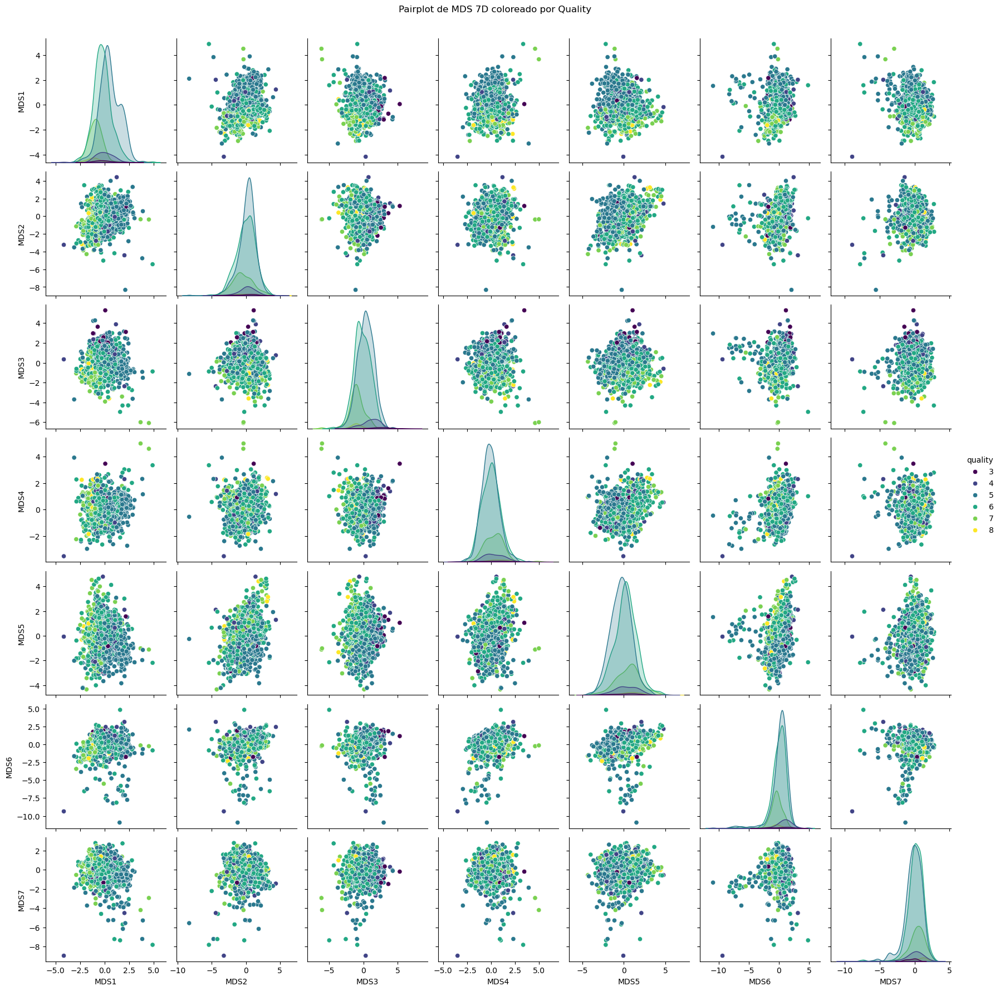

In [17]:
sns.pairplot(
    MDSdata,
    vars=[f"MDS{i}" for i in range(1, 8)],   # MDS1 ... MDS7
    hue="quality",
    palette="viridis",
    diag_kind="kde"
)

plt.suptitle("Pairplot de MDS 7D coloreado por Quality", y=1.02)
plt.show()

Ahora que ya tenemos nuestro dataset original y una versión de dimensión reducida, vamos a aplicar un DBSCAN a cada uno. Recordemos el aspecto que tenía nuestra matriz de gráficos de dispersión del dataset original, no observamos a priori una estructura de clusters en nuestros datos, y según hemos comprobado más recientemente, nuestro dataset de dimensión reducida tampoco. Por tanto es prudente esperar que el DBSCAN no arroje resultados potentes. Comenzamos con el clustering del dataset original.

Antes de realizar el DBSCAN en sí, debemos elegir el mejor valor de radio de vecindad. Observamos que en el gráfico de distancia media a 12 vecinos (nuestro valor fijo elegido para min_samples, justificado en el *jupyter notebook*), el codo sucede entorno a 2.7, por tanto ese será el valor que elegiremos.

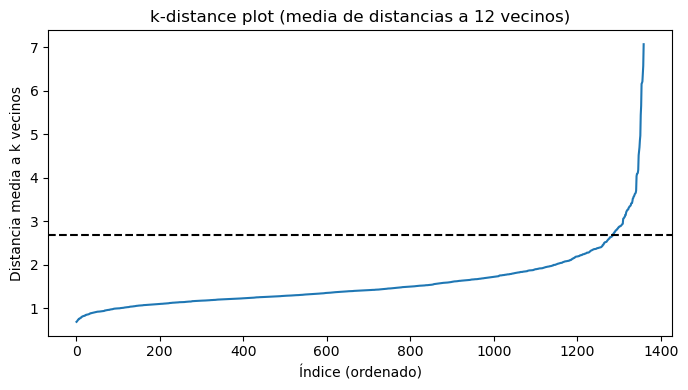

In [18]:
# DBSCAN no funciona demasiado bien con variables en escalas muy diferentes (nuestro caso)
# de modo que estandarizamos
DBSCANwines = wines_scaled.drop(columns='quality')

# fijamos min_samples y calculamos k-distance plot para determinar el mejor valor de eps
# la mayoría de documentación sobre DBSCAN recomienda usar un min_samples de 2*dimensión o dimensión+1
# por lo tanto nuestro min_samples recomendado está entre 12 y 22
# elegiremos 12 para maximizar la sensibilidad del algoritmo dentro del rango
min_samples = 12

nbrs = NearestNeighbors(
    n_neighbors=min_samples + 1,  # +1 para incluir el propio punto
    algorithm="auto"
).fit(DBSCANwines)

distances, _ = nbrs.kneighbors(DBSCANwines)

# quitamos la columna 0 (distancia 0 a sí mismo) y promediamos sobre los k vecinos
mean_k_dist = distances[:, 1:].mean(axis=1)

# ordenamos para el gráfico
kd_sorted = np.sort(mean_k_dist)

plt.figure(figsize=(7, 4))
plt.plot(np.arange(1, len(kd_sorted) + 1), kd_sorted)
plt.title(f"k-distance plot (media de distancias a {min_samples} vecinos)")
plt.xlabel("Índice (ordenado)")
plt.ylabel("Distancia media a k vecinos")

# línea horizontal marcando un eps candidato (ajusta según el codo que veas)
plt.axhline(y=2.7, color="black", linestyle="--")

plt.tight_layout()
plt.show()

Ahora realizamos el DBSCAN con valores de 2.7 para el eps y de 12 para min_samples. Como habíamos pronosticado, se forma un gran cluster separado de puntos marcados como ruido por el algoritmo de clustering. Sin embargo sucede algo que no habíamos previsto, DBSCAN diferencia también un segundo cluster formado por un grupo minoritario de puntos, podemos verlo diferenciado del grupo principal en algunos de los gráficos de dispersión. Notamos que no es un cluster lo suficientemente relevante como para construir un modelo de predicción separado para dicho cluster.

Parámetros: eps=2.7, min_samples=12
Clústers encontrados (sin contar ruido): 2
Puntos etiquetados como ruido: 54


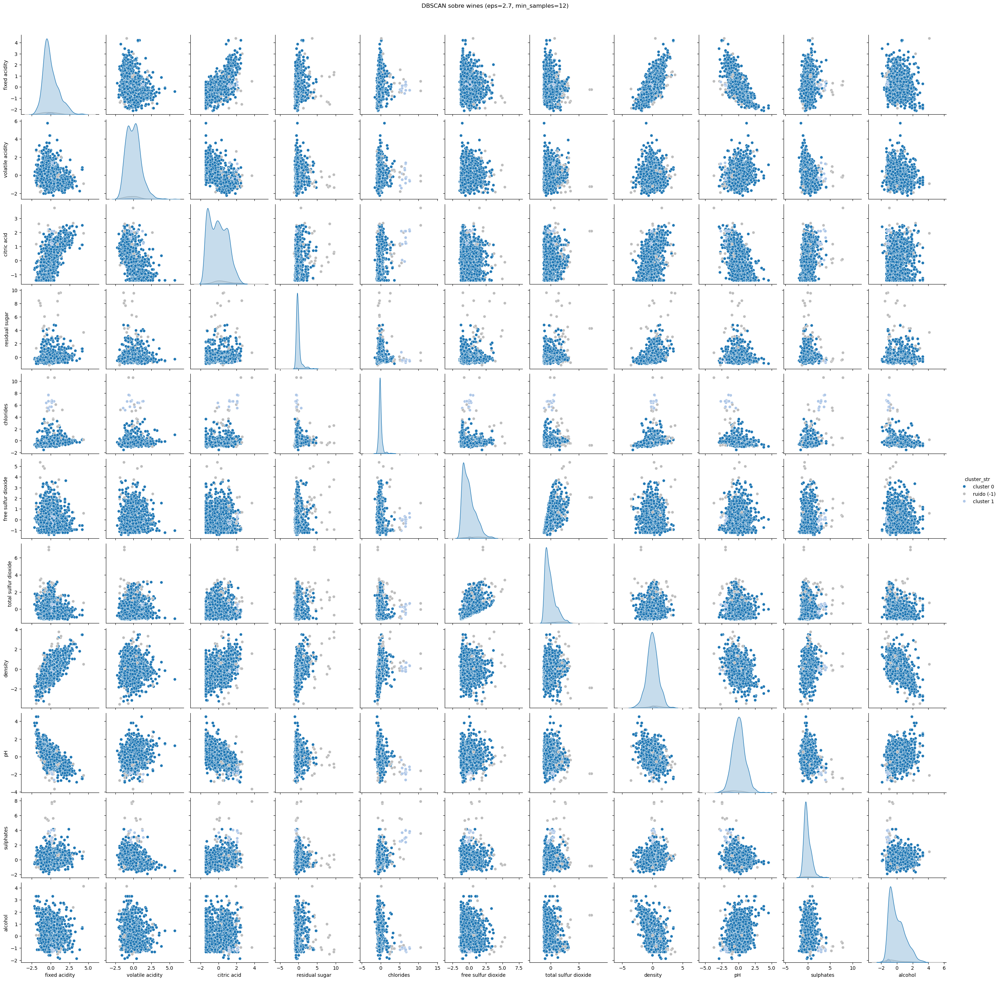

In [19]:
eps_elegido = 2.7

db = DBSCAN(eps=eps_elegido, min_samples=min_samples).fit(DBSCANwines)
labels = db.labels_

# report de parámetros elegidos y resultados obtenidos
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = np.sum(labels == -1)
print(f"Parámetros: eps={eps_elegido}, min_samples={min_samples}")
print(f"Clústers encontrados (sin contar ruido): {n_clusters}")
print(f"Puntos etiquetados como ruido: {n_noise}")

# transformamos a dataframe para poder manipular
wines_clusters = DBSCANwines.copy()
wines_clusters["cluster"] = labels

# creamos una columna string para ruido y clusters, para controlar colores
wines_clusters["cluster_str"] = wines_clusters["cluster"].map(
    lambda c: "ruido (-1)" if c == -1 else f"cluster {c}"
)

# extraemos la cantidad de clusters generados para asignarles colores
unique_labels = wines_clusters["cluster_str"].unique()

# quitamos el ruido para generar la paleta base
sin_ruido = [lab for lab in unique_labels if lab != "ruido (-1)"]
base_palette = sns.color_palette("tab20", n_colors=len(sin_ruido))

palette = {}
i = 0
for lab in unique_labels:
    if lab == "ruido (-1)":
        palette[lab] = "#bdbdbd"  # gris
    else:
        palette[lab] = base_palette[i]
        i += 1

# matriz de dispersión para visualizar los clusters generados
sns.pairplot(
    wines_clusters,
    vars=DBSCANwines.columns,  
    hue="cluster_str",
    palette=palette,
    diag_kind="kde"
)

plt.suptitle(
    f"DBSCAN sobre wines (eps={eps_elegido}, min_samples={min_samples})",
    y=1.02
)
plt.show()

Procederemos a continuación y de manera similar para el dataset reducido fruto del MDS. Observamos que para un valor de min_samples que hemos establecido como 8, el codo se encuentra en un punto muy similar al anterior, esta vez estando más cerca de 2.5.

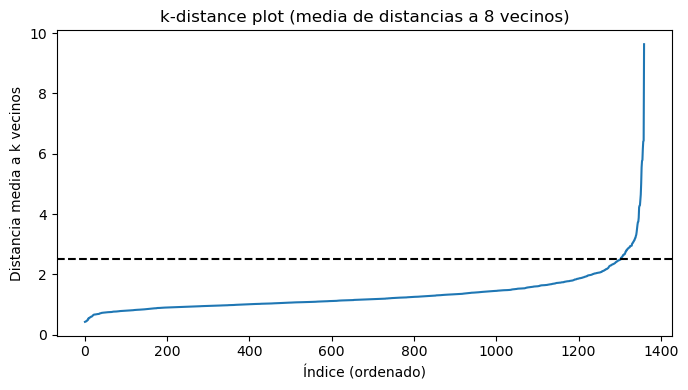

In [20]:
DBSCANMDS = MDSdata.drop(columns='quality')

# para este dataset, min_samples debería situarse entorno a 8 y 14, por tanto elegiremos 8
min_samples = 8

nbrs = NearestNeighbors(
    n_neighbors=min_samples + 1,  # +1 para incluir el propio punto
    algorithm="auto"
).fit(DBSCANMDS)

distances, _ = nbrs.kneighbors(DBSCANMDS)

# quitamos la columna 0 (distancia 0 a sí mismo) y promediamos sobre los k vecinos
mean_k_dist = distances[:, 1:].mean(axis=1)

# ordenamos para el gráfico
kd_sorted = np.sort(mean_k_dist)

plt.figure(figsize=(7, 4))
plt.plot(np.arange(1, len(kd_sorted) + 1), kd_sorted)
plt.title(f"k-distance plot (media de distancias a {min_samples} vecinos)")
plt.xlabel("Índice (ordenado)")
plt.ylabel("Distancia media a k vecinos")

# línea horizontal marcando un eps candidato (ajusta según el codo que veas)
plt.axhline(y=2.5, color="black", linestyle="--")

plt.tight_layout()
plt.show()

Realizaremos ahora el DBSCAN correspondiente para un eps de 2.5 y un min_samples de 8, veamos los resultados. Podemos comprobar que ajustando los valores de los parámetros para que sean acordes a la menor dimensión de este dataset frente al original, el DBSCAN a partir del MDS detecta los mismos clusters que a partir del dataset original. Concluimos en última instancia que la reducción de dimensionalidad a partir de MDS no ha supuesto una diferencia a la hora de aplicar técnicas de clustering sobre los datos.

Parámetros: eps=2.5, min_samples=8
Clústers encontrados (sin contar ruido): 2
Puntos etiquetados como ruido: 40


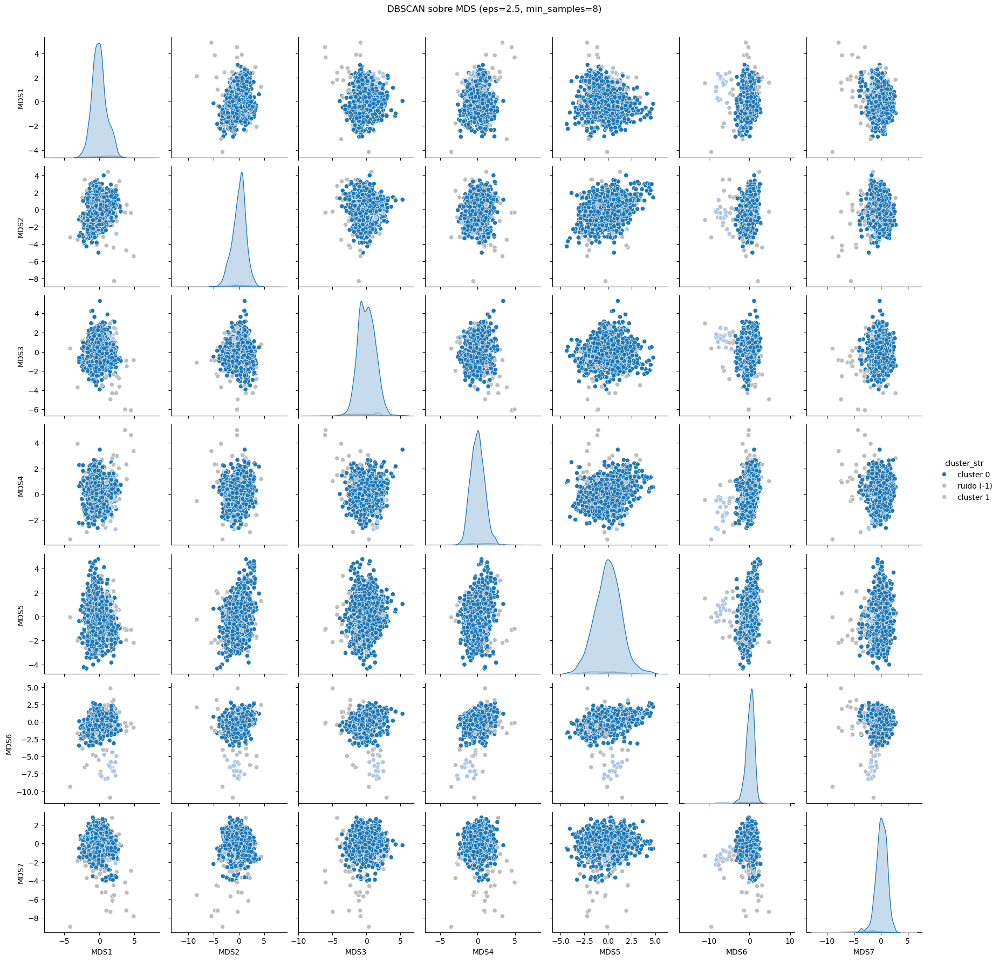

In [21]:
eps_elegido = 2.5

db = DBSCAN(eps=eps_elegido, min_samples=min_samples).fit(DBSCANMDS)
labels = db.labels_

# report de parámetros elegidos y resultados obtenidos
n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
n_noise = np.sum(labels == -1)
print(f"Parámetros: eps={eps_elegido}, min_samples={min_samples}")
print(f"Clústers encontrados (sin contar ruido): {n_clusters}")
print(f"Puntos etiquetados como ruido: {n_noise}")

# transformamos a dataframe para poder manipular
wines_clusters = DBSCANMDS.copy()
wines_clusters["cluster"] = labels

# creamos una columna string para ruido y clusters, para controlar colores
wines_clusters["cluster_str"] = wines_clusters["cluster"].map(
    lambda c: "ruido (-1)" if c == -1 else f"cluster {c}"
)

# extraemos la cantidad de clusters generados para asignarles colores
unique_labels = wines_clusters["cluster_str"].unique()

# quitamos el ruido para generar la paleta base
sin_ruido = [lab for lab in unique_labels if lab != "ruido (-1)"]
base_palette = sns.color_palette("tab20", n_colors=len(sin_ruido))

palette = {}
i = 0
for lab in unique_labels:
    if lab == "ruido (-1)":
        palette[lab] = "#bdbdbd"  # gris
    else:
        palette[lab] = base_palette[i]
        i += 1

# matriz de dispersión para visualizar los clusters generados
sns.pairplot(
    wines_clusters,
    vars=DBSCANMDS.columns,  
    hue="cluster_str",
    palette=palette,
    diag_kind="kde"
)

plt.suptitle(
    f"DBSCAN sobre MDS (eps={eps_elegido}, min_samples={min_samples})",
    y=1.02
)
plt.show()

A la vista de estas conclusiones, modelaremos el árbol de clasificación y la red neuronal a partir del dataset original, dado que resulta más interpretable que las dimensiones del MDS. Comenzaremos con el árbol de clasificación, que se construye de manera muy similar al árbol de regresión de la primera parte. Dividiremos los datos en 80% para entrenamiento y 20% para test, con validación cruzada de 5 capas para obtener los mejores valores de los mismos hiperparámetros que en la primera parte. Para evaluar los árboles utilizaremos la F1-score macro debido a que es una métrica que tiene en cuenta desbalanced de clases y evita que no se predigan nunca las clases más minoritarias, como 3 o 8 en nuestro caso. También se calculará la Accuracy clásica a modo de comparación.

Mejores hiperparámetros:
{'clf__max_depth': 3, 'clf__min_samples_leaf': 20, 'clf__min_samples_split': 10}
Accuracy train:   0.4416
F1-macro train:   0.3202

Classification report (train):
              precision    recall  f1-score   support

           3       0.11      1.00      0.19         8
           4       0.11      0.12      0.11        42
           5       0.54      0.60      0.57       461
           6       0.49      0.30      0.37       428
           7       0.36      0.42      0.39       134
           8       0.20      0.57      0.29        14

    accuracy                           0.44      1087
   macro avg       0.30      0.50      0.32      1087
weighted avg       0.47      0.44      0.44      1087

Accuracy test:    0.4118
F1-macro test:    0.2899

Classification report (test):
              precision    recall  f1-score   support

           3       0.06      0.50      0.10         2
           4       0.27      0.27      0.27        11
           5       0.50  

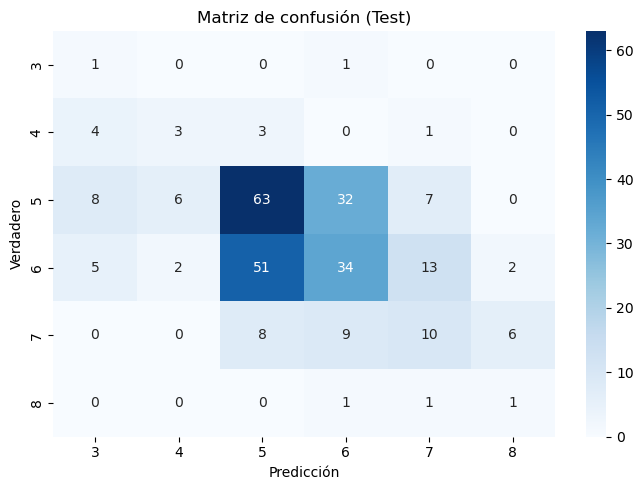

In [22]:
X = wines.drop(columns=["quality"])
# debemos cambiar el tipo de dato a category y no a object para que el árbol de clasificación
# lo detecte como variable multiclase correctamente
y = wines["quality"].astype("category")

# los árboles no necesitan estandarización y no tenemos categóricas, no necesitaremos preprocesar

# al realizar el split debemos mantener las proporciones de aparición de cada clase
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

# pipeline con el clasificador
pipe = Pipeline(steps=[
    ("clf", DecisionTreeClassifier(class_weight='balanced', random_state=42))
])

# grid de hiperparámetros, debemos ser más estrictos dado que por prueba y error hemos visto
# que con estos datos el arbol es muy propenso al overfitting
param_grid = {
    "clf__max_depth": [2, 3, 4],
    "clf__min_samples_split": [10, 20],
    "clf__min_samples_leaf": [20, 30]
}

# estrategia de validación interna estratificada
# mantenemos en cada fold las mismas proporciones de aparición de cada clase
cv_strat = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV para clasificación con F1 macro
grid = GridSearchCV(
    estimator=pipe,
    param_grid=param_grid,
    cv=cv_strat,
    scoring="f1_macro",
    n_jobs=-1
)

# entrenamos
grid.fit(X_train, y_train)

print("Mejores hiperparámetros:")
print(grid.best_params_)
best_model = grid.best_estimator_

# métricas en entrenamiento
y_pred_train = best_model.predict(X_train)
acc_train = accuracy_score(y_train, y_pred_train)
f1_train = f1_score(y_train, y_pred_train, average="macro")
print(f"Accuracy train:   {acc_train:.4f}")
print(f"F1-macro train:   {f1_train:.4f}")
print("\nClassification report (train):")
print(classification_report(y_train, y_pred_train))

# test
y_pred_test = best_model.predict(X_test)
acc_test = accuracy_score(y_test, y_pred_test)
f1_test = f1_score(y_test, y_pred_test, average="macro")
print(f"Accuracy test:    {acc_test:.4f}")
print(f"F1-macro test:    {f1_test:.4f}")
print("\nClassification report (test):")
print(classification_report(y_test, y_pred_test))

# calculamos la matriz de confusión para visualizar mejor las clasificaciones realizadas
cm = confusion_matrix(y_test, y_pred_test, labels=sorted(y.cat.categories))
plt.figure(figsize=(7, 5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
            xticklabels=sorted(y.cat.categories),
            yticklabels=sorted(y.cat.categories))
plt.title("Matriz de confusión (Test)")
plt.xlabel("Predicción")
plt.ylabel("Verdadero")
plt.tight_layout()
plt.show()

Tenemos que hay cierto overfitting, dado que la accuracy se reduce entorno a un 7% (de 0.44 a 0.41), y la F1-score entorno a un 9% (de 0.32 a 0.29), hemos notado que hemos necesitado ser más estrictos con los posibles valores de los hiperparámetros dado que para estos datos el árbol era muy propenso al sobreajuste. Podemos ver que el rendimiento es medio, dado que tenemos 6 clases un estimador trivial que prediga cada clase con la misma probabilidad obtendría un Accuracy de 0.166 aproximadamente, este árbol obtiene en test un accuracy de 0.41, lo cual es más del doble que la aleatoriedad pero aún así no llega a ser considerado un valor alto. 

Sin embargo, si miramos la F1-score, que tiene en cuenta los desbalances a la hora de evaluar las predicciones realizadas por el árbol, es algo más baja. Vemos en el desglose de métricas que la clase peor predicha ha sido la 4, con F1-score de 0.11, inferior a la aleatoriedad, y que la mejor predicha ha sido la 5 con un F1-score de 0.57.

Aunque dada la naturaleza y codificación de la variable respuesta quality se podría tratar como una variable respuesta numérica, como hemos hecho para algunos gráficos, no es del todo correcto utilizar en este caso un árbol de regresión dado que no podemos asumir que las clases, transformadas a escala numérica continua, sean equidistantes. Todo lo contrario, es razonable asumir que la distancia entre un 3 y un 4 es mayor en realidad a la distancia entre un 6 y un 7, dado que a medida que se enfrentan a un vino de mejor calidad, los jueces tienden a ser cada vez más minuciosos con su evaluación. 

Vamos a visualizar el árbol modelado a continuación.

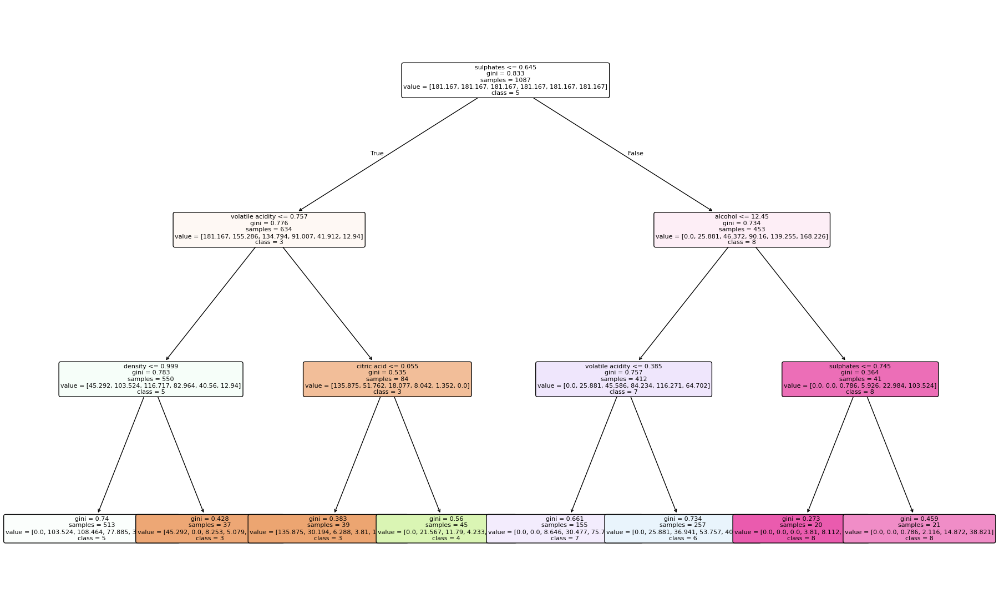

In [23]:
tree = grid.best_estimator_.named_steps["clf"]

plt.figure(figsize=(22, 14))
plot_tree(
    tree,
    filled=True,
    feature_names=X.columns,
    class_names=[str(c) for c in tree.classes_],  # clases en orden
    rounded=True,
    fontsize=8
)
plt.show()

Obtenemos un árbol mucho más explicable que los de la primera parte, fundamentalmente debido a que lo hemos forzado a ser así para evitar sobreajuste. Podemos ver que más cantidad de sulfatos y alcohol conducen a vinos de mayor calidad, mientras que poseer una mayor densidad, y más cantidad de ácido acético conducen a vinos de peor calidad. Estas conclusiones se encuentran en línea con lo que hemos estado comentando durante toda esta segunda parte.

Vamos a construir ahora la red neuronal para el conjunto de datos originales. Deberemos adaptar las métricas y la estructura de capas a las particularidades del dataset wines con respecto a la estructura diseñada para el dataset diamonds en la primera parte del trabajo.
Para evaluar la red neuronal se usarán, como en el caso del árbol, la F1-score y la Accuracy, además se establecerá Categorical Crossentropy como función de pérdidas tal y como se indica en las prácticas de la asignatura. A continuación tenemos los gráficos de evolución de la pérdida, y evolución de la ganancias tanto de F1-score como de Accuracy.


In [32]:
# volvemos a instanciar X por seguridad
X = wines.drop(columns='quality')
y = wines["quality"]
class_names = np.sort(np.unique(y))
num_classes = len(class_names)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# en redes neuronales necesitamos escalar las variables numéricas
scaler = StandardScaler().fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# en redes neuronales necesitamos codificar las variables categóricas
# para usar categorical_crossentropy como función de pérdida debemos hacer one-hot encoding
# debemos reetiquetar la variable respuesta para que la indexación no falle
label_to_index = {label: idx for idx, label in enumerate(class_names)} # {3:0, 4:1, 5:2, 6:3, 7:4, 8:5}
y_train_idx = y_train.map(label_to_index).to_numpy()
y_test_idx  = y_test.map(label_to_index).to_numpy()
y_train_encoded = keras.utils.to_categorical(y_train_idx, num_classes)
y_test_encoded  = keras.utils.to_categorical(y_test_idx,  num_classes)

# red neuronal con estructura de capas similar a las de la primera parte
# reducimos la profundiad de las capas y aumentamos el dropout para reducir el overfitting
wines_model = keras.Sequential(
    [
        keras.layers.Input(shape=(X_train_scaled.shape[1],)),
        keras.layers.BatchNormalization(),
        keras.layers.Dense(64, activation="relu", kernel_regularizer=regularizers.l2(1e-4)),
        keras.layers.BatchNormalization(),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation="relu", kernel_regularizer=regularizers.l2(1e-4)),
        keras.layers.Dropout(0.3),
        keras.layers.Dense(32, activation="relu"),
        keras.layers.Dense(num_classes, activation="softmax")
    ]
)

wines_model.summary()

f1_macro = keras.metrics.F1Score(name="F1-score", average="macro")

wines_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.003),
    loss="categorical_crossentropy",
    metrics=[
        f1_macro,
        keras.metrics.CategoricalAccuracy(name="accuracy")]
)

wines_es = keras.callbacks.EarlyStopping(
    patience=20,
    restore_best_weights=True,
    monitor="val_loss"
)

history_wines = wines_model.fit(
    X_train_scaled,
    y_train_encoded,
    validation_split=0.2,
    epochs=200,
    batch_size=16,
    callbacks=[wines_es],
    verbose=1
)

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ batch_normalization_2           │ (None, 11)             │            44 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │           768 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64)             │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 32)             │         1,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 6)              │           198 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,402 (17.20 KB)

 Trainable params: 4,252 (16.61 KB)

 Non-trainable params: 150 (600.00 B)

Epoch 1/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 6s 29ms/step - F1-score: 0.1873 - accuracy: 0.4626 - loss: 1.3170 - val_F1-score: 0.2313 - val_accuracy: 0.5826 - val_loss: 1.2905
Epoch 2/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - F1-score: 0.2329 - accuracy: 0.5362 - loss: 1.1240 - val_F1-score: 0.2654 - val_accuracy: 0.5642 - val_loss: 1.2013
Epoch 3/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - F1-score: 0.2432 - accuracy: 0.5397 - loss: 1.0543 - val_F1-score: 0.2616 - val_accuracy: 0.5550 - val_loss: 1.0917
Epoch 4/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - F1-score: 0.2575 - accuracy: 0.5708 - loss: 1.0195 - val_F1-score: 0.2606 - val_accuracy: 0.5505 - val_loss: 1.0328
Epoch 5/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step - F1-score: 0.2600 - accuracy: 0.5662 - loss: 1.0260 - val_F1-score: 0.2753 - val_accuracy: 0.5734 - val_loss: 1.0064
Epoch 6/200
55/55 ━━━━━━━━━━━━━━━━━━━━ 1s 12ms/step - F1-score: 0.2426 - accuracy: 0.5685 - loss: 1.0028 - val_F1-score: 0.2797 - val_accuracy: 0.5826 - v

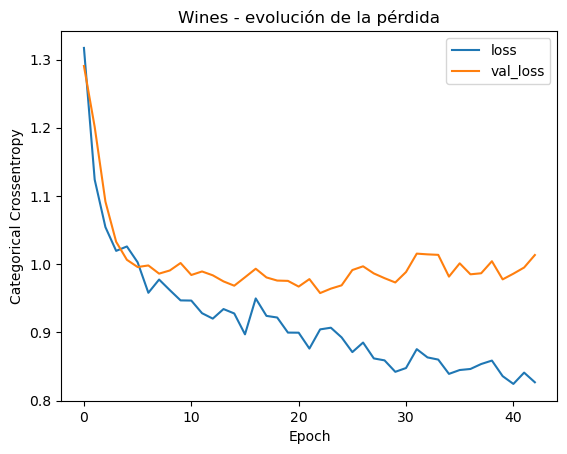

In [33]:
history_df = pd.DataFrame(history_wines.history)

history_df[["loss", "val_loss"]].plot(title="Wines - evolución de la pérdida")
plt.ylabel("Categorical Crossentropy")
plt.xlabel("Epoch")
plt.show()

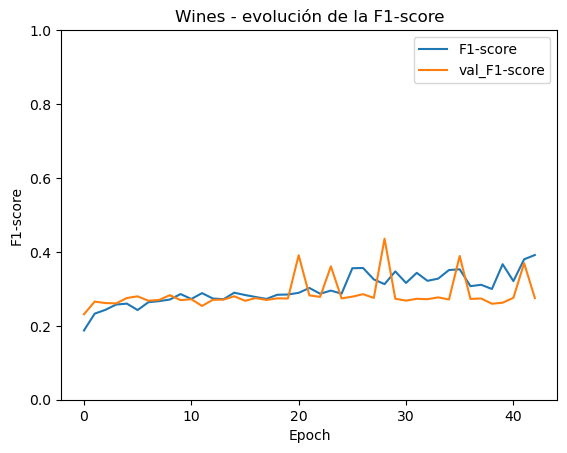

In [34]:
history_df[["F1-score", "val_F1-score"]].plot(title="Wines - evolución de la F1-score")
plt.ylabel("F1-score")
plt.xlabel("Epoch")
plt.ylim(0, 1)
plt.show()

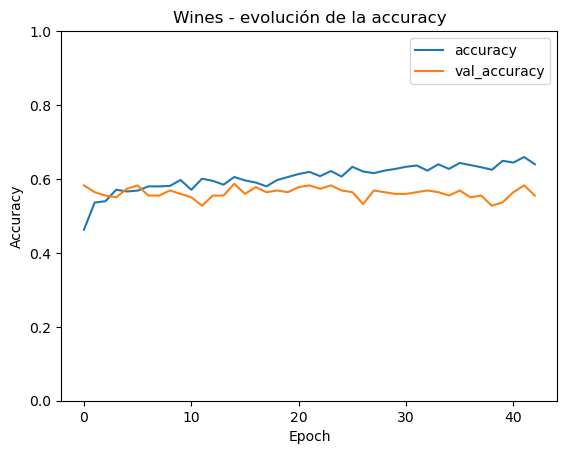

In [35]:
history_df[["accuracy", "val_accuracy"]].plot(title="Wines - evolución de la accuracy")
plt.ylabel("Accuracy")
plt.xlabel("Epoch")
plt.ylim(0, 1)
plt.show()

Como ya veíamos al construir el árbol, los modelos de predicción son propensos al sobreajuste con este dataset, de modo que hemos realizado algunos ajustes sobre la estructura de capas de la red neuronal diseñada en la primera parte. Fundamentalmente hemos aumentado el dropout y reducido la profundidad de las capas para reducir el sobreajuste. Aún así vemos en la gráfica de pérdida que sigue habiendo cierto sobreajuste, sin embargo hemos logrado que en términos de accuracy y F1-score este sea mínimo, como veremos explícitamente más adelante. Una vez construida y ejecutada la red neuronal hemos obtenido los siguientes resultados.

Train Loss:  0.89 | Train F1-score:  0.30 | Train Accuracy:  0.61 | 
Test Loss:  0.98 | Test F1-score:  0.30 | Test Accuracy:  0.60 | 
9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


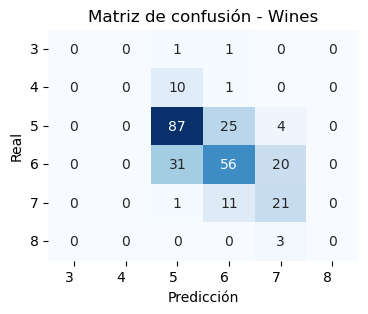

,Real,Predicción,Probabilidad máxima
0,5,5,0.77043
1,6,6,0.50152
2,6,5,0.42922
3,5,5,0.86762
4,6,6,0.54678
5,5,6,0.56772
6,6,5,0.70331
7,6,5,0.67730
8,5,5,0.74596
9,6,6,0.51187


In [36]:
wines_eval_train = wines_model.evaluate(X_train_scaled, y_train_encoded, verbose=0)
print(
    f"Train Loss:  {wines_eval_train[0]:.2f} | "
    f"Train F1-score:  {wines_eval_train[1]:.2f} | "
    f"Train Accuracy:  {wines_eval_train[2]:.2f} | "
)

wines_eval_test = wines_model.evaluate(X_test_scaled, y_test_encoded, verbose=0)
print(
    f"Test Loss:  {wines_eval_test[0]:.2f} | "
    f"Test F1-score:  {wines_eval_test[1]:.2f} | "
    f"Test Accuracy:  {wines_eval_test[2]:.2f} | "
)

wines_probs = wines_model.predict(X_test_scaled)
wines_pred_classes = wines_probs.argmax(axis=1)

conf_mat = tf.math.confusion_matrix(y_test_idx, wines_pred_classes, num_classes=num_classes)
plt.figure(figsize=(4, 3))
sns.heatmap(conf_mat, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicción")
plt.ylabel("Real")
plt.xticks(np.arange(num_classes) + 0.5, class_names, rotation=0, ha="right")
plt.yticks(np.arange(num_classes) + 0.5, class_names, rotation=0)
plt.title("Matriz de confusión - Wines")
plt.show()

n_test = X_test_scaled.shape[0]
sample_ids = np.arange(n_test)
rng = np.random.default_rng(0)
chosen = rng.choice(sample_ids, size=10, replace=False)

pd.DataFrame(
    {
        "Real": class_names[y_test_idx[chosen]],
        "Predicción": class_names[wines_pred_classes[chosen]],
        "Probabilidad máxima": wines_probs[chosen].max(axis=1).round(5),
    }
)

Podemos comprobar que se trata de un mejor modelo al árbol en términos de Accuracy, lo cual se puede comprobar fácilmente comparando esta última matriz de confusión con la obtenida en el árbol de clasificación, que era notablemente peor. Sin embargo, la F1-score ha permanecido prácticamente igual, posiblemente debido al hecho de que el mejor ajuste obtenido por la red neuronal se ha visto contrarrestado con el hecho de que ha concentrado más sus predicciones alrededor de los valores más frecuentes, resultando en que no ha predicho correctamente ninguna instancia de quality 3, 4 o 8, cosa que el árbol de regresión sí hacía.

Del ánalisis realizado sobre el conjunto de datos de vinos podemos concluir que la teoría expuesta por la bibliografía acerca del impacto teórico de cada variable en la calidad de un vino dado es generalmente correcta. Mayores cantidades de compuestos como el ácido acético, los cloruros o una mayor densidad impactarán negativamente la calidad del vino, mientras que incrementar las cantidades de ácido cítrico, alcohol o sulfatos harán que el vino sea mejor valorado.

Tras la exploración inicial se aplicó una reducción de la dimensionalidad mediante MDS y se comparó si suponía una mejora frente al conjunto de datos original a la hora de agrupar a los vinos en diferentes clusters basados en sus cualidades. No se apreció impacto alguno. Finalmente se modelaron un árbol de clasificación y una red neuronal para comparar sus capacidades predictivas, llegando a la conclusión de que la red neuronal es superior, como sucedió en la primera parte del trabajo.

El objetivo principal de este trabajo ha sido evaluar el impacto de distintos métodos de reducción de la dimensionalidad sobre la aplicación de técnicas de clustering y algoritmos predictivos, con resultados variados. Concluimos que mientras que sí permiten simplificar modelos predictivos sin apenas afectar a su capacidad de predicción, no presentan una diferencia significativa en cuanto a la aplicación de técnicas de clustering.


# Modelo extra y explicabilidad
En esta parte se explorará un modelo no visto en clase, el Random Forest, aplicado a nuestro problema de clasificación y se comparará su rendimiento, ventajas e inconvenientes frente al árbol de clasificación y la red neuronal. Después se investigará la aplicación de una técnica de explicabilidad a la red neuronal de clasificación realizada en el apartado anterior.

Comenzamos construyendo el Random Forest. Podemos reutilizar casi todo el código que escribimos para el árbol de decisión, simplemente tenemos que cambiar el estimador que instanciamos en la pipeline, esta es una de las mayores ventajas de scikit-learn, que proporciona una serie de estructuras estándar muy versátiles. Introducimos en el grid de hiperparámetros dos nuevos:

- *n_estimators*: Número de árboles que compondrán el bosque.
- *max_features*: Número de variables, elegidas aleatoriamente, que cada árbol considera a la hora de realizar cada split.

Obtenemos los siguientes resultados:

Mejores hiperparámetros (Random Forest):
{'clf__max_depth': 5, 'clf__max_features': 'sqrt', 'clf__min_samples_leaf': 10, 'clf__min_samples_split': 5, 'clf__n_estimators': 200}
Accuracy train (RF):   0.5685
F1-macro train (RF):   0.5475

Classification report (train, RF):
              precision    recall  f1-score   support

           3       0.47      1.00      0.64         8
           4       0.29      0.76      0.42        42
           5       0.69      0.74      0.71       461
           6       0.71      0.27      0.39       428
           7       0.41      0.81      0.54       134
           8       0.41      1.00      0.58        14

    accuracy                           0.57      1087
   macro avg       0.50      0.76      0.55      1087
weighted avg       0.64      0.57      0.55      1087

Accuracy test (RF):    0.4963
F1-macro test (RF):    0.2786

Classification report (test, RF):
              precision    recall  f1-score   support

           3       0.00      0.00  

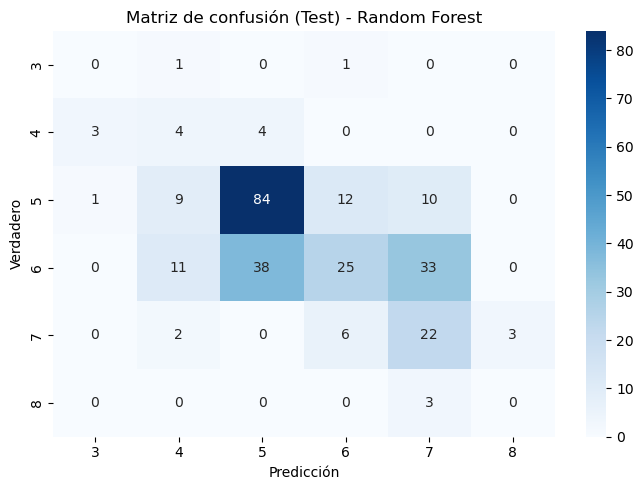

In [37]:
X_rf = wines.drop(columns=["quality"])
y_rf = wines["quality"].astype("category")

# split estratificado
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(
    X_rf, y_rf, test_size=0.2, random_state=42, stratify=y_rf
)

# pipeline con Random Forest
pipe_rf = Pipeline(steps=[
    ("clf", RandomForestClassifier(
        class_weight="balanced",
        random_state=42,
        n_jobs=-1
    ))
])

# grid de hiperparámetros para Random Forest
param_grid_rf = {
    "clf__n_estimators": [100, 200],
    "clf__max_depth": [2, 3, 4, 5],
    "clf__min_samples_split": [5, 10, 20, 40],
    "clf__min_samples_leaf": [10, 20, 30, 50],
    # como valores de max_features usaremos sqrt, que da el floor de la raíz del número de variables, y log2,
    # el floor (redondeo hacia abajo) del logaritmo con base 2 del número de variables
    # ambos valores son clásicos en problemas de clasificación y ayudan a reducir el sobreajuste, log2 es
    # especialmente restrictivo
    "clf__max_features": ['sqrt', "log2"]
}

# validación interna estratificada
cv_strat_rf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# GridSearchCV para RF en función de F1 macro
grid_rf = GridSearchCV(
    estimator=pipe_rf,
    param_grid=param_grid_rf,
    cv=cv_strat_rf,
    scoring="f1_macro",
    n_jobs=-1
)

# entrenamos
grid_rf.fit(X_train_rf, y_train_rf)

print("Mejores hiperparámetros (Random Forest):")
print(grid_rf.best_params_)
best_model_rf = grid_rf.best_estimator_

# métricas en train
y_pred_train_rf = best_model_rf.predict(X_train_rf)
acc_train_rf = accuracy_score(y_train_rf, y_pred_train_rf)
f1_train_rf = f1_score(y_train_rf, y_pred_train_rf, average="macro")
print(f"Accuracy train (RF):   {acc_train_rf:.4f}")
print(f"F1-macro train (RF):   {f1_train_rf:.4f}")
print("\nClassification report (train, RF):")
print(classification_report(y_train_rf, y_pred_train_rf))

# métricas en test
y_pred_test_rf = best_model_rf.predict(X_test_rf)
acc_test_rf = accuracy_score(y_test_rf, y_pred_test_rf)
f1_test_rf = f1_score(y_test_rf, y_pred_test_rf, average="macro")
print(f"Accuracy test (RF):    {acc_test_rf:.4f}")
print(f"F1-macro test (RF):    {f1_test_rf:.4f}")
print("\nClassification report (test, RF):")
print(classification_report(y_test_rf, y_pred_test_rf))

# matriz de confusión
cm_rf = confusion_matrix(y_test_rf, y_pred_test_rf, labels=sorted(y_rf.cat.categories))
plt.figure(figsize=(7, 5))
sns.heatmap(
    cm_rf,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=sorted(y_rf.cat.categories),
    yticklabels=sorted(y_rf.cat.categories)
)
plt.title("Matriz de confusión (Test) - Random Forest")
plt.xlabel("Predicción")
plt.ylabel("Verdadero")
plt.tight_layout()
plt.show()

Vemos que el modelo que hemos construido posee un mayor sobreajuste a los anteriores, esto es debido a que hemos utilizado valores de hiperparámetros en el grid que son más propensos al sobreajuste en pos de obtener el mejor modelo posible, ya que un modelo con menor sobreajuste también daba un peor rendimiento con los datos de test. Podemos hacer esto gracias a que el método de Random Forest ofrece mayor capacidad de generalización y menor sobreajuste que un árbol individual gracias al bagging y el muestreo aleatorio de variables, a cambio es mucho menos interpretable y representable gráficamente (al estar compuesto en nuestro caso por 200 árboles distintos) y más costoso computacionalmente.

Comparando el Random Forest con el árbol de clasificación vemos que el primero posee mayor Accuracy y peor F1-score, lo que indica que está sesgado a predecir unas clases sobre otras en mayor medida que el árbol de clasificación, pero que en total acierta más casos. Si lo comparamos con la red neuronal pierde en todas las métricas, y es que resulta difícil superar en rendimiento a la reina de los problemas de aprendizaje supervisado, aunque la red neuronal es aún más costosa computacionalmente que el Random Forest.

Para finalizar este trabajo aplicaremos una técnica de explicabilidad a nuestra red neuronal, utilizaremos SHAP ya que es la herramienta más utilizada actualmente. Aunque lo aplicaremos a la red neuronal, SHAP proporciona un método agnóstico de modelo, lo cual significa que también podríamos utilizarla para explicar el Random Forest que al igual que la red neuronal (aunque en menor medida) es un modelo de caja negra.

Comenzamos preparando el background (conjunto train de la red neuronal) y el conjunto a explicar (test), tras esto creamos el explicador SHAP. A menudo se utilizan muestras de los conjuntos train y test para el background y el conjunto a explicar pero dado que nuestros tamaños no son demasiado grandes podemos proceder con todos los datos.

In [ ]:
feature_names = X.columns.tolist()

# función que shap llamará: recibe np.array (n, p) y devuelve (n, num_classes)
# es el adaptador que permite a SHAP llamar a la red neuronal (wines_model) y obtener las probabilidades
def predict_proba(x):
    return wines_model(x).numpy()

# background (train), actúa como la distribución de referencia 
rng = np.random.RandomState(42) # volvemos a declarar la semilla de numpy por seguridad
X_bg = X_train_scaled

# conjunto a explicar globalmente (test)
X_explain = X_test_scaled

# definimos el masker (estrategia de perturbación de variables)
# dado que no tenemos correlaciones fuertes entre las variables usamos .Independent
masker = shap.maskers.Independent(X_bg)  # tabular masker sobre background

# explicador SHAP
explainer = shap.Explainer(predict_proba, masker, feature_names=feature_names , output_names=[str(c) for c in class_names])

A continuación visualizamos mediante un par de gráficos la explicación global del modelo, es decir, cómo influye cada variable en general para el conjunto del dataset.

PermutationExplainer explainer: 273it [01:13,  3.25it/s]                         


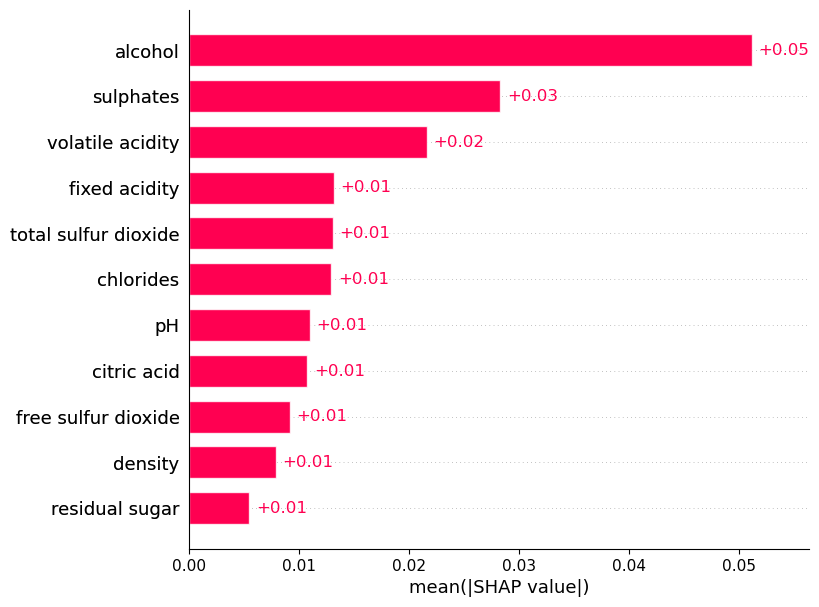

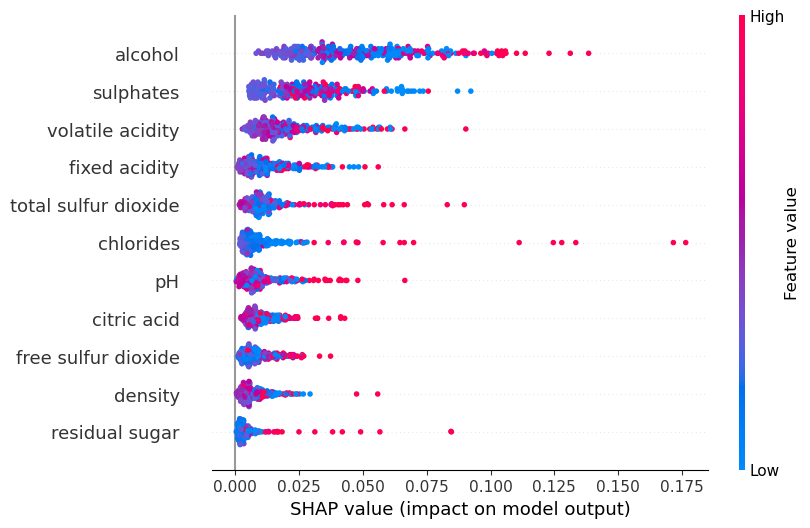

In [ ]:
# EXPLICACIÓN GLOBAL
shap_values = explainer(X_explain)
# agregamos |SHAP| sobre clases -> (n, p)
values_agg = np.mean(np.abs(shap_values.values), axis=2)

shap_values_agg = shap.Explanation(
    values=values_agg,
    base_values=np.mean(shap_values.base_values, axis=1) if shap_values.base_values.ndim == 2 else shap_values.base_values,
    data=shap_values.data,
    feature_names=shap_values.feature_names
)

shap.plots.bar(shap_values_agg, max_display=15)
shap.plots.beeswarm(shap_values_agg, max_display=15)

En primer lugar en el barplot tenemos la influencia medida sobre el promedio de la variación en valor absoluto sobre la variable respuesta ejercida por cada variable explicativa, agregada sobre las clases. En otras palabras, el barplot no indica la dirección hacia la que empuja cada variable sino que mide la importancia de su influencia sobre la respuesta. Vemos que la estructura global de la red neuronal está dominada por el alcohol, los sulfatos y el ácido acético.

En segundo lugar, el Beeswarm nos habla de si son los valores altos o bajos de cada variable los que impactan más en la calidad del vino, de nuevo no indica dirección sino importancia de la influencia. Vemos que para variables como el azúcar residual y los cloruros los valores altos poseen mayor influencia que los bajos, sin embargo para otras variables como el alcohol o los sulfatos no parece ser tan lineal el efecto, e incluso encontramos varaibles como el pH o el ácido cítrico donde los valores altos tienen las influencias más altas y más bajas, mientras que los valores bajos tienen influencias medias sobre la calidad.

Vamos ahora a realizar algunas visualización que nos ayuden a explicar localmente la red neuronal, es decir, qué impacto y en qué dirección ha tenido cada variable a la hora de clasificar a un individuo en concreto, en este caso lo haremos para el vino que corresponde al índice 24.

Probabilidades: {np.int64(3): np.float32(0.0012), np.int64(4): np.float32(0.0159), np.int64(5): np.float32(0.6355), np.int64(6): np.float32(0.346), np.int64(7): np.float32(0.0013), np.int64(8): np.float32(0.0)}
Clase predicha: 5


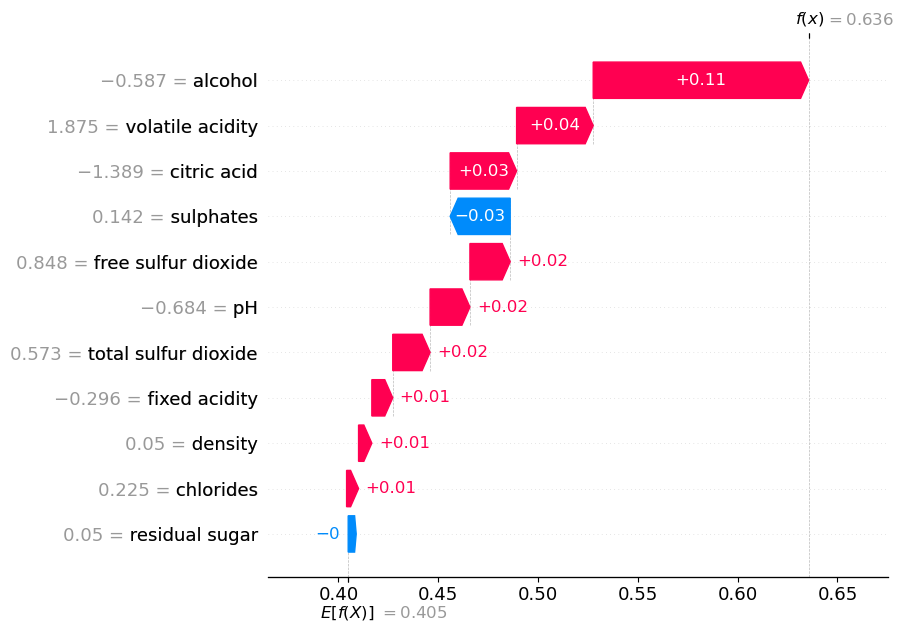

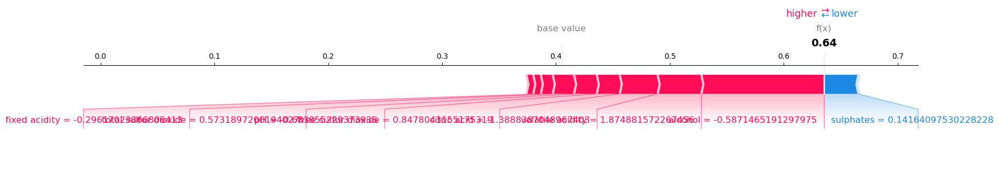

In [52]:
# EXPLICACIÓN LOCAL
i = 24  # cambia al índice que quieras dentro de X_test_scaled
x0 = X_test_scaled[i:i+1]
proba0 = predict_proba(x0)[0]
pred_idx = int(np.argmax(proba0))
pred_class = class_names[pred_idx]
print("Probabilidades:", dict(zip(class_names, proba0.round(4))))
print("Clase predicha:", pred_class)
sv0 = explainer(x0)  # shap values de esa observación

shap.plots.waterfall(
    sv0[0, :, pred_idx],  # (features,) para esa clase
    max_display=15
)

shap.force_plot(
    sv0[0, :, pred_idx].base_values,
    sv0[0, :, pred_idx].values,
    features=x0[0],
    feature_names=feature_names,
    matplotlib=True
)

El individuo ha sido predicho como un vino de calidad 5 por la red neuronal.

En el gráfico de waterfall podemos ver que la probabilidad base asignada a un individuo de pertenecer a la clase 5 (antes de conocer ninguna característica) es de 0.405, resulta bastante alta pero es coherente con el hecho de que es la clase mayoritaria. A la probabilidad base se le suman los efectos del valor que toma cada variable en ese individuo hasta llegar a una probabilidad asignada de 0.636, ya que para el caso concreto de este individuo y sus valores para cada variable, la única que tiene un efecto negativo es sulfatos. Las variables que tienen un mayor impacto son el alcohol, el ácido acético y el ácido cítrico, cuyos valores en este vino han aumentado la probabilidad de que sea clasificado como un vino de calidad 5.

El segundo gráfico proporciona otra forma de ver los efectos agregados de las variables para el caso de este individuo.